# plots

In [1]:
from matplotlib import pyplot as plt
import pandas as pd
import numpy as np

import os, sys
repo_root = os.path.abspath(os.path.join(os.getcwd(), ".."))
if repo_root not in sys.path:
    sys.path.insert(0, repo_root)

from llmdap.metadata_schemas.taxonomy_traverser import AI_TAXONOMY


ccs_strings = str(AI_TAXONOMY).split("'")[1::2]


In [2]:
# Load data
import os
all_dfs = {}
for file in os.listdir("../output_labels"):
    df = pd.read_csv("../output_labels/"+file, index_col=0)
    all_dfs[file[:-15]] = df
    df["date"] = pd.to_datetime(df["date"])
    df["predicted_tag"] = df["predicted_tag"].astype(str)

hf_df = all_dfs["hf"]
arx_df = all_dfs["arx"]
arx_long = all_dfs["arx_long"]
#imp_df = all_dfs["imp"]
#imp_long = all_dfs["imp_long"]
dlw_df = all_dfs["dlw"]
dlw_long = all_dfs["dlw_long"]
#tldr_df = all_dfs["tldr"]

In [3]:
import numpy as np
import pandas as pd

def calculate_curve(dates, search_radius=(25, "W"), n_steps=100):
    """
    Calculates the y-values of a simple linear-spline smoothing of term popularity.
    Each event contributes a triangular kernel that linearly decays to zero over `search_radius`.
    Edge mirroring is applied to reduce boundary effects.

    Parameters
    ----------
    dates : array-like of pandas.Timestamp (Series/DatetimeIndex ok)
        Time stamps for publications of a document labeled with the term.
    search_radius : tuple
        (number, unit) usable by pd.Timedelta, e.g. (25, "W") for 25 weeks.
    n_steps : int
        Number of x-points to evaluate between min(dates) and max(dates).

    Returns
    -------
    X : pandas.DatetimeIndex
        Grid of timestamps (length n_steps).
    Y : np.ndarray
        Smoothed popularity values aligned to X (length n_steps).
    """
    # Coerce inputs
    dates = pd.to_datetime(pd.Series(dates).dropna()).sort_values().to_list()
    if len(dates) == 0:
        # Nothing to smooth
        return pd.DatetimeIndex([], name="X"), np.array([])

    min_date = dates[0]
    max_date = dates[-1]

    # Build evaluation grid
    X = pd.date_range(start=min_date, end=max_date, periods=n_steps)

    # Timedelta radius in ns (for numpy datetime arithmetic)
    radius_td = pd.Timedelta(*search_radius)
    sr_ns = np.timedelta64(radius_td.value, 'ns')

    # Base event times as numpy datetime64[ns]
    D = np.array(dates, dtype='datetime64[ns]')

    # --- Edge mirrors (only for dates within one radius of the edges) ---
    min_date = min_date.to_period("M").to_timestamp(how="start")
    max_date = max_date.to_period("M").to_timestamp(how="end")

    min_np = np.array(min_date, dtype='datetime64[ns]')
    max_np = np.array(max_date, dtype='datetime64[ns]')

    left_mask = (D - min_np) < sr_ns
    right_mask = (max_np - D) < sr_ns

    # Mirror formulas: L = 2*min - d, R = 2*max - d
    D_left = (min_np + (min_np - D[left_mask]))
    D_right = (max_np + (max_np - D[right_mask]))

    # Augmented event set
    D_all = np.concatenate([D, D_left, D_right]) if (D_left.size or D_right.size) else D

    # --- Vectorized triangular kernel sum ---
    X_np = X.to_numpy(dtype='datetime64[ns]')

    # Pairwise distances (n_steps x n_events) as timedelta64[ns]
    dist = np.abs(X_np[:, None] - D_all[None, :])

    # Linear decay: (sr - dist)/sr for dist <= sr, else 0
    # Convert to float safely
    weights = (sr_ns - dist) / sr_ns
    weights = np.where(dist <= sr_ns, weights.astype(float), 0.0)

    Y = weights.sum(axis=1)

    # standardize to documents per month
    Y = Y * (pd.Timedelta(30.44, "D") / radius_td) # 30.44 days per month avg

    # divide by total amount, * 100, to get popularity in percentage
    Y = Y / 30 * 100
    
    return X, Y



def plot_line(df, term, search_radius = (25, "W"), ax=None, **plt_kwargs):
    """Plot smoothened curve using plt"""

    # get the part of the dataframe with the term
    all_dates = df["date"].values
    dates = df[df["predicted_tag"].str.contains("'"+term+"'")]["date"]

    # Calculate the curve
    X,Y = calculate_curve(dates, search_radius=search_radius, n_steps=100)

    if "label" in plt_kwargs:
        plt_kwargs["label"] += " ("+str(len(dates))+")" # add number of values to the legend label
    if ax is None:
        plt.plot(X,Y, **plt_kwargs)
    else:
        ax.plot(X,Y, **plt_kwargs)



all_df = pd.concat([hf_df, arx_df, dlw_df])[["date","predicted_tag"]]


def plot_term_continuous(term, min_total=30):
    # plot line figure
    assert type(term) is str

    # require at least min_total values
    all_dates = all_df[all_df["predicted_tag"].str.contains("'"+term+"'")]["date"]
    if len(all_dates)<min_total:
        return

    # plot each line
    plot_line(arx_df, term, label="arx", color='#1f77b4')
    plot_line(hf_df, term, label="HF", color='#ff7f0e')

    plt.ylim(bottom=0)
    plt.title(term)
    plt.legend()
    plt.show()

def plot_term_continuous_long(term, min_total=30, search_radius = (25,"W"), ax = None):
    # plot line figure
    assert type(term) is str

    # require at least min_total values
    all_dates = arx_long[arx_long["predicted_tag"].str.contains("'"+term+"'")]["date"]
    if len(all_dates)<min_total:
        return
    
    double_radius = (search_radius[0]*4, search_radius[1])

    l2 = "solid"
    l1 = "solid"
    a1=1
    a2=0.5

    # plot each line
    plot_line(arx_long, term,search_radius=search_radius, ax=ax, label="arXiv", color='#1f77b4', linestyle=l2, alpha=a2)
    plot_line(hf_df, term,search_radius=search_radius, ax=ax,  label="HF", color='#ff7f0e', linestyle=l2, alpha=a2)
    plot_line(dlw_long, term,search_radius=search_radius, ax=ax,  label="DLW", color="#949827", linestyle=l2, alpha=a2)

    # plot each line
    plot_line(arx_long, term,search_radius=double_radius, ax=ax, color='#1f77b4', linestyle=l1, alpha=a1)
    plot_line(hf_df, term,search_radius=double_radius, ax=ax, color='#ff7f0e', linestyle=l1, alpha=a1)
    plot_line(dlw_long, term,search_radius=double_radius, ax=ax, color="#949827", linestyle=l1, alpha = a1)


    if ax is None:
        plt.xlabel("Year")

        plt.ylim(bottom=0)
        plt.title(term)
        plt.legend()
        #plt.savefig("../../../figs/"+term.replace(" ", "_").replace("/","__")+".pdf")
        plt.show()
    else:

        ax.set_ylim(bottom=0)
        ax.set_title(term)
        ax.legend()


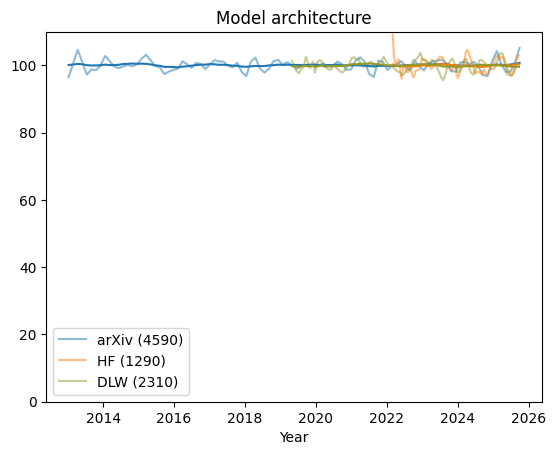

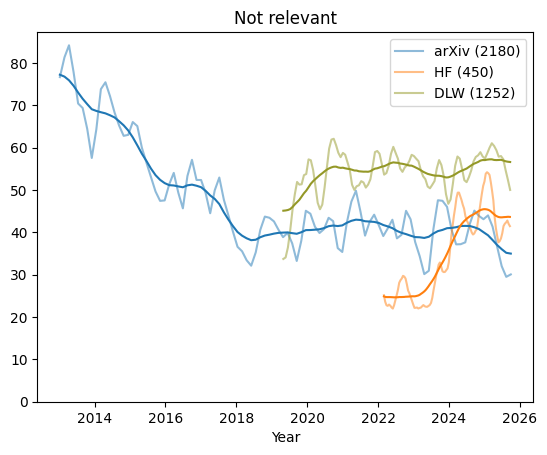

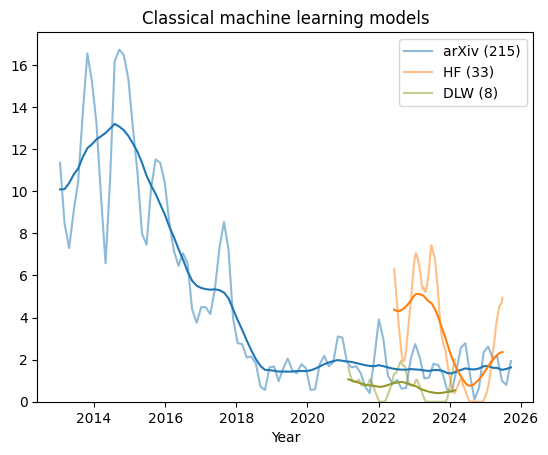

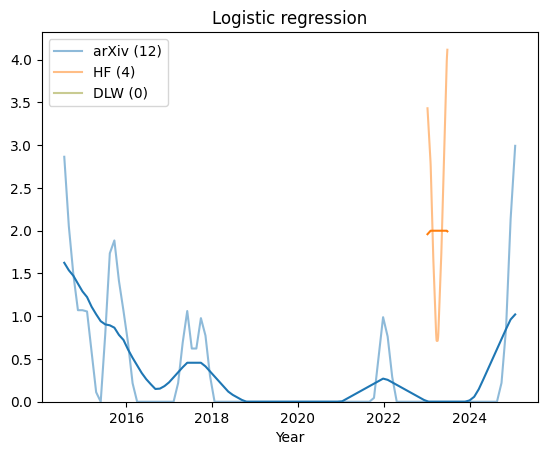

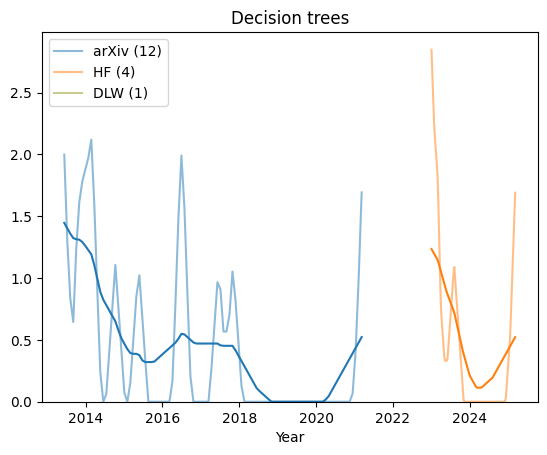

...

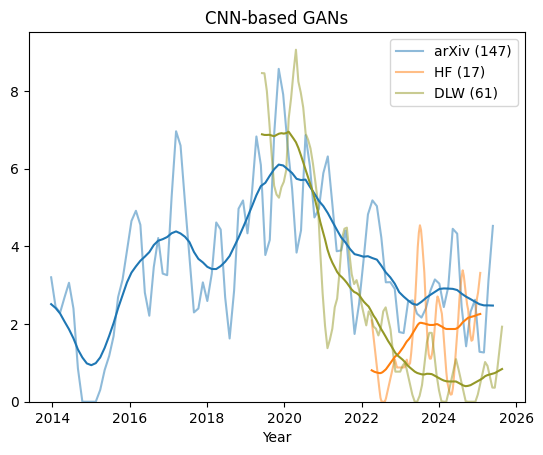

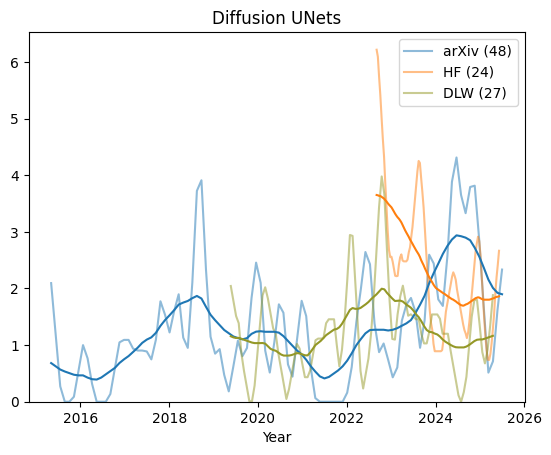

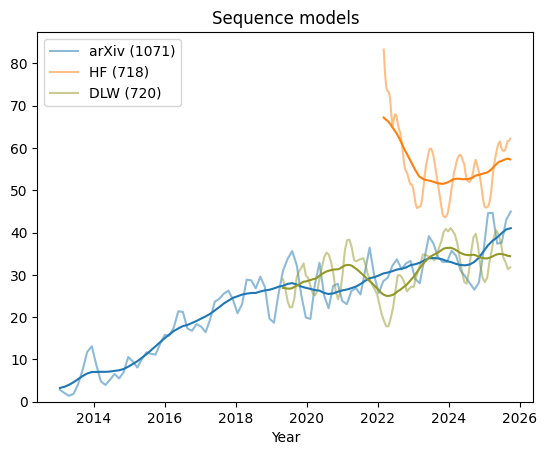

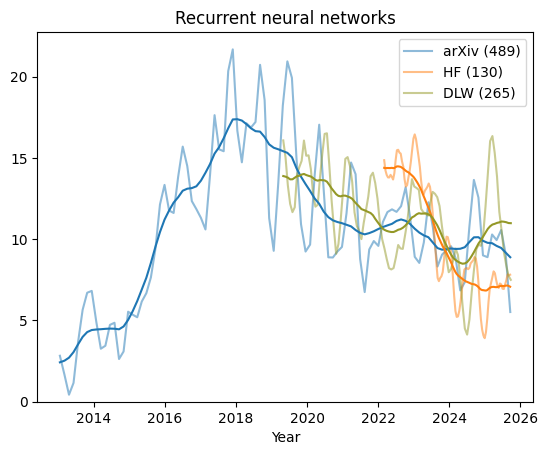

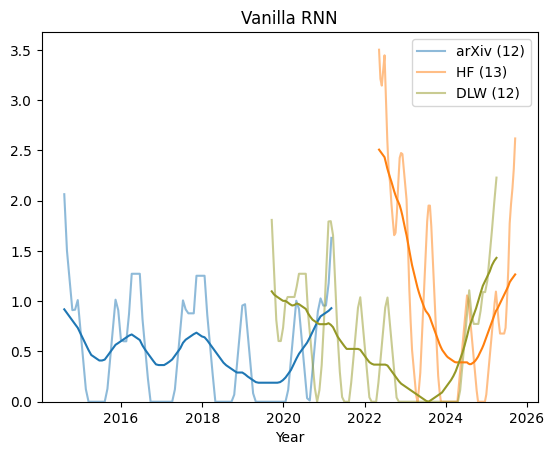

/var/folders/kc/4fy77x1j1dz0t15g8zhlqmkc0000gn/T/ipykernel_86165/914863173.py:130: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  all_dates = arx_long[arx_long["predicted_tag"].str.contains("'"+term+"'")]["date"]


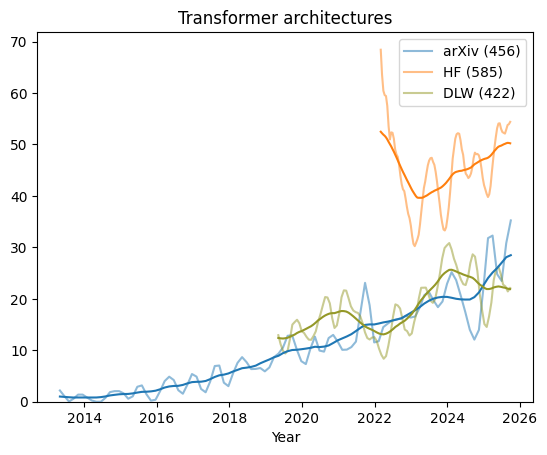

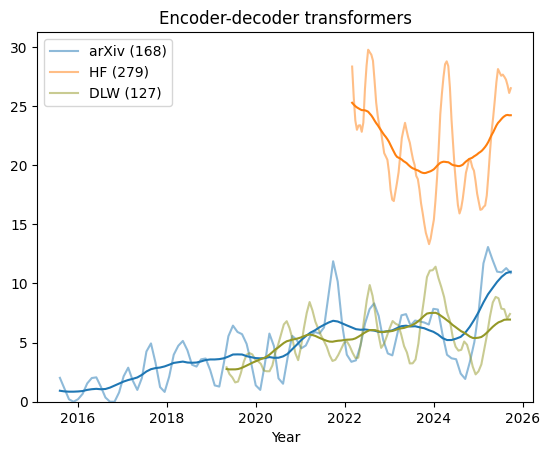

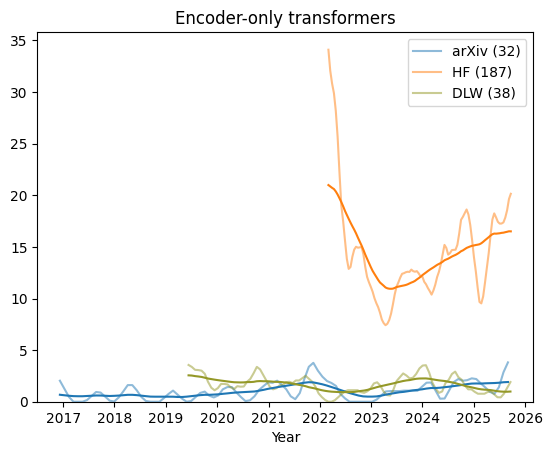

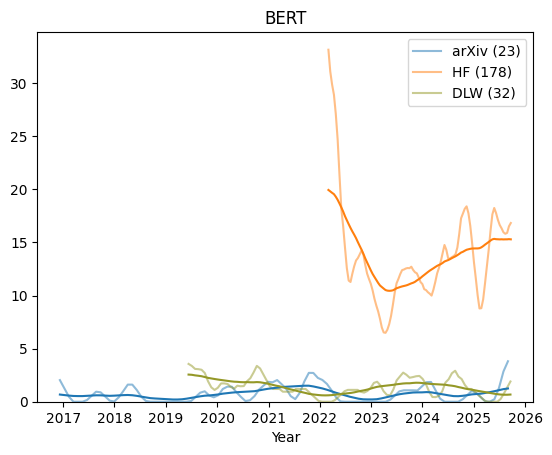

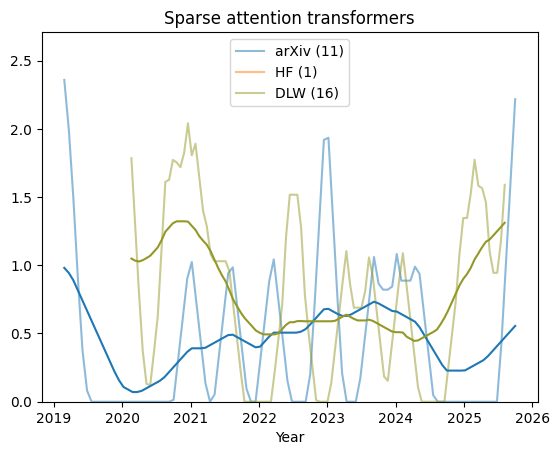

...

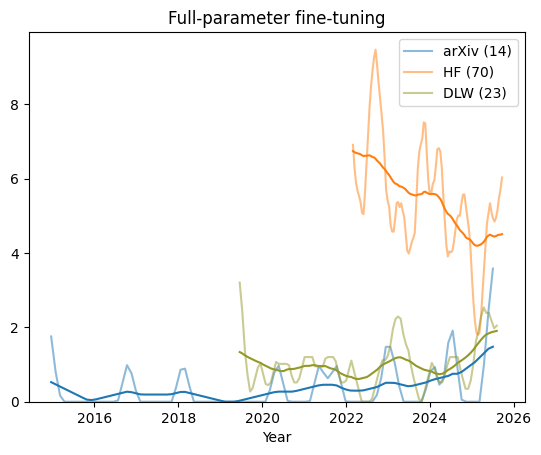

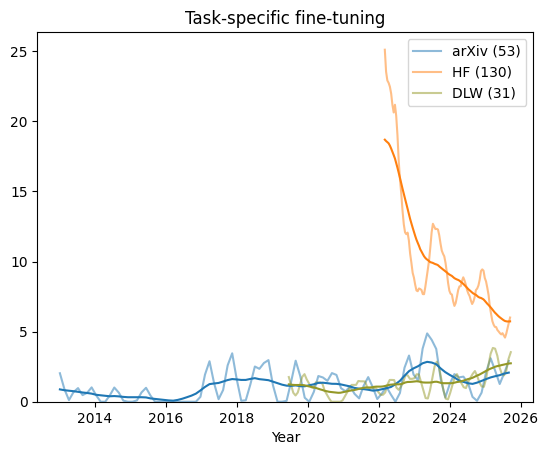

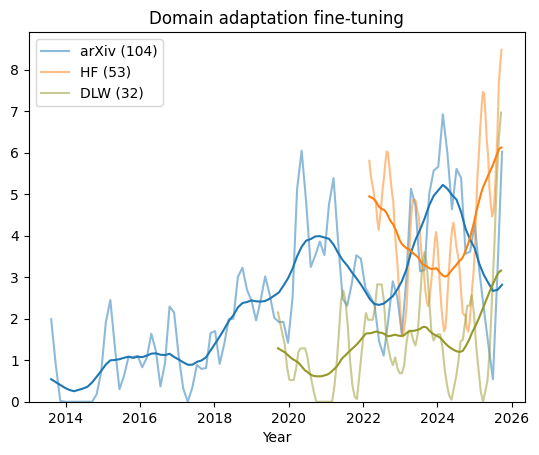

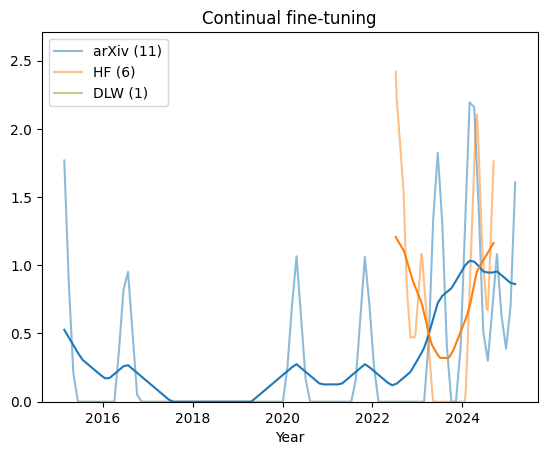

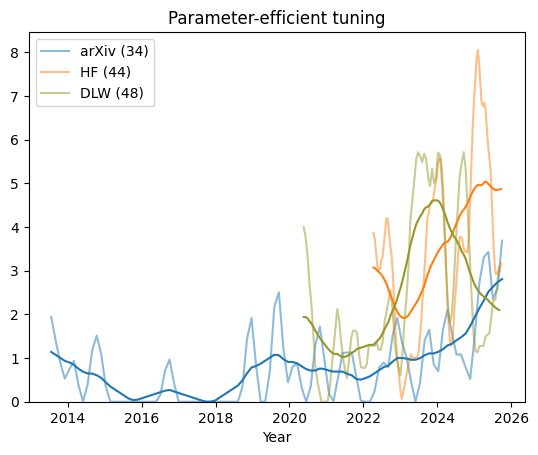

/var/folders/kc/4fy77x1j1dz0t15g8zhlqmkc0000gn/T/ipykernel_86165/914863173.py:130: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  all_dates = arx_long[arx_long["predicted_tag"].str.contains("'"+term+"'")]["date"]


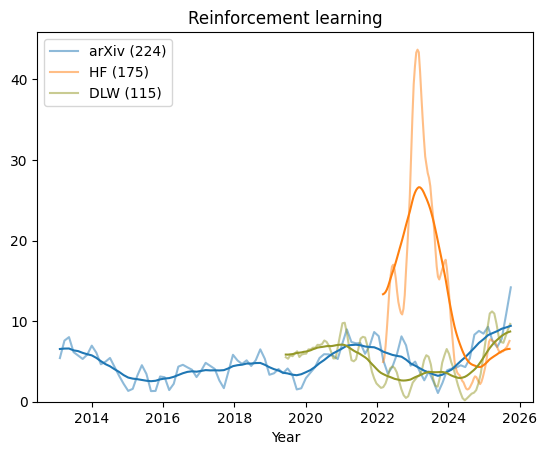

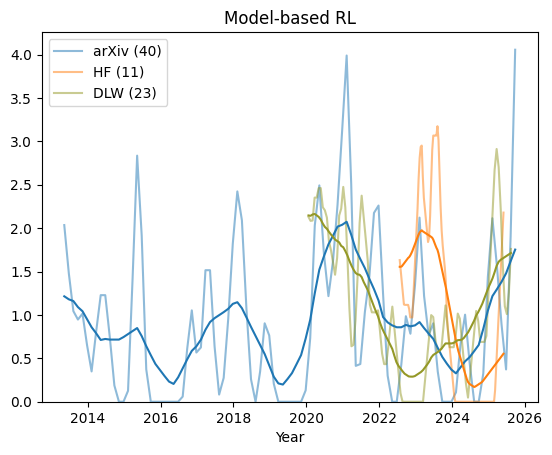

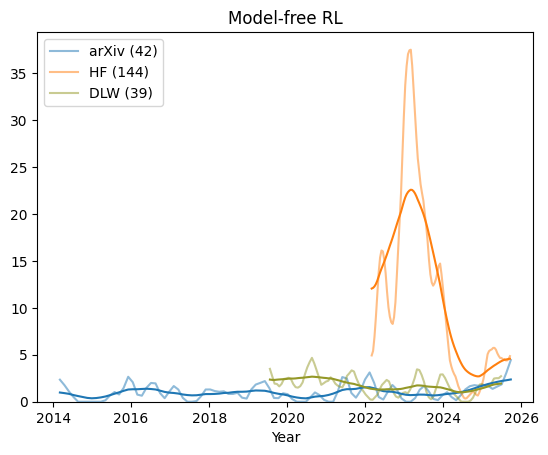

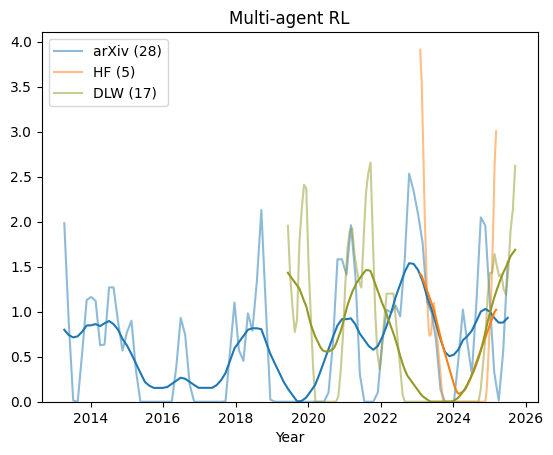

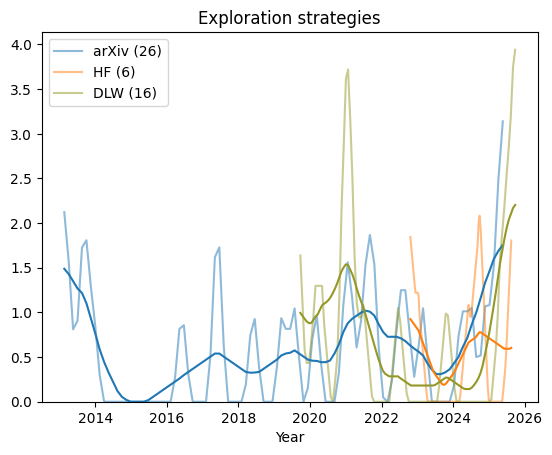

...

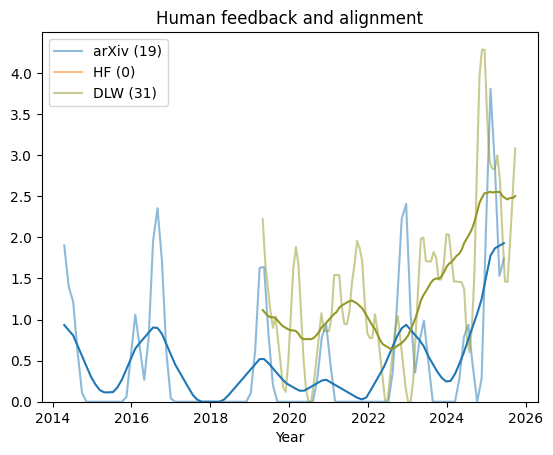

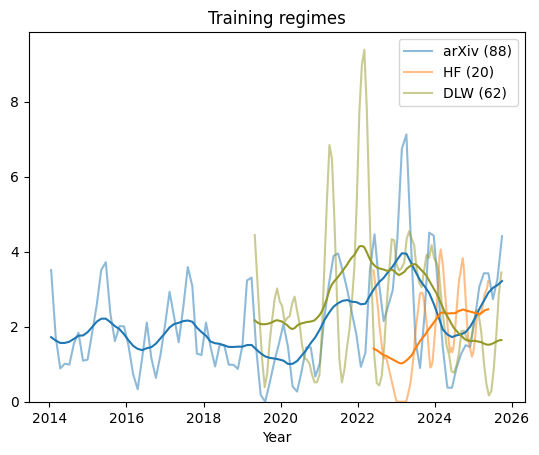

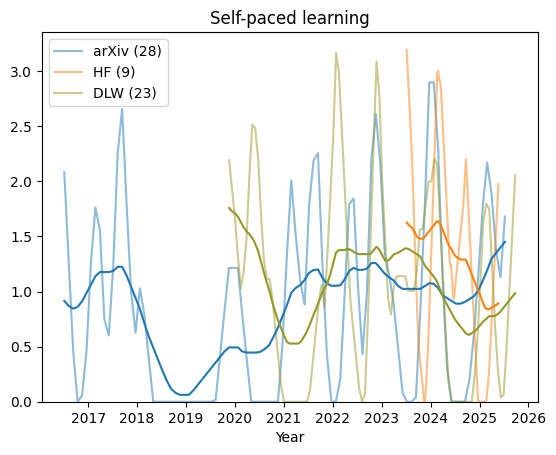

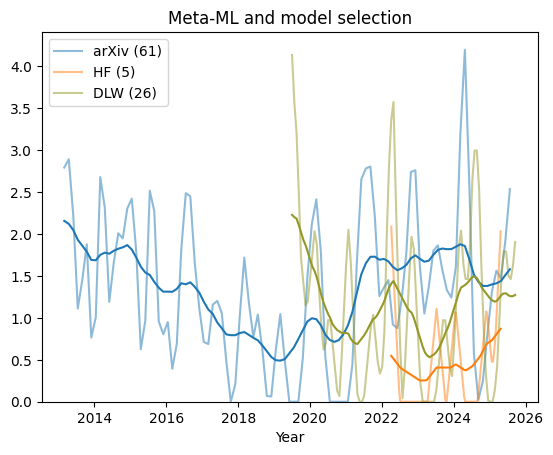

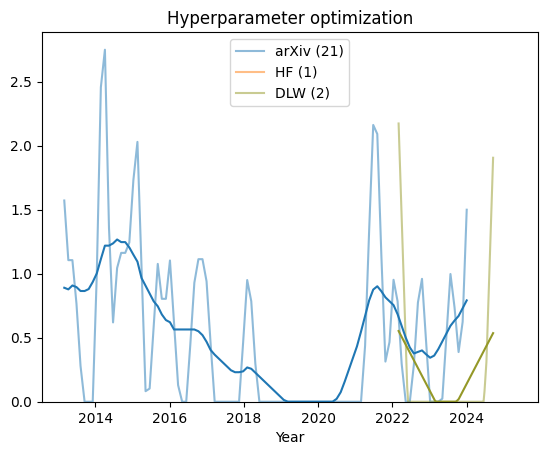

/var/folders/kc/4fy77x1j1dz0t15g8zhlqmkc0000gn/T/ipykernel_86165/914863173.py:130: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  all_dates = arx_long[arx_long["predicted_tag"].str.contains("'"+term+"'")]["date"]


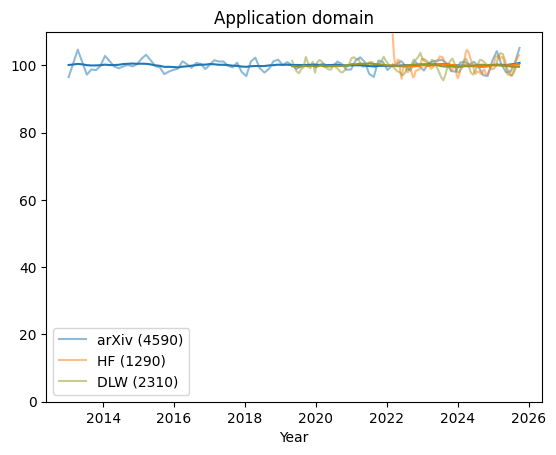

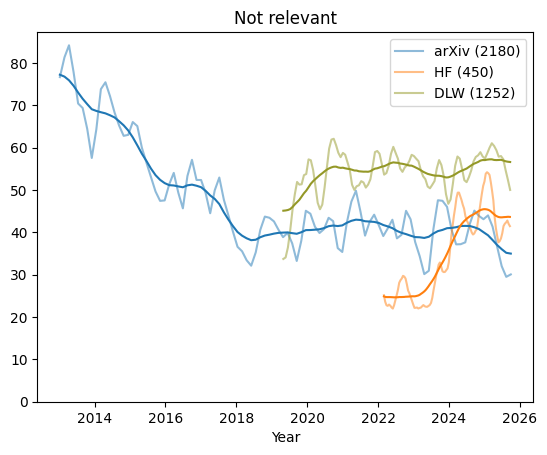

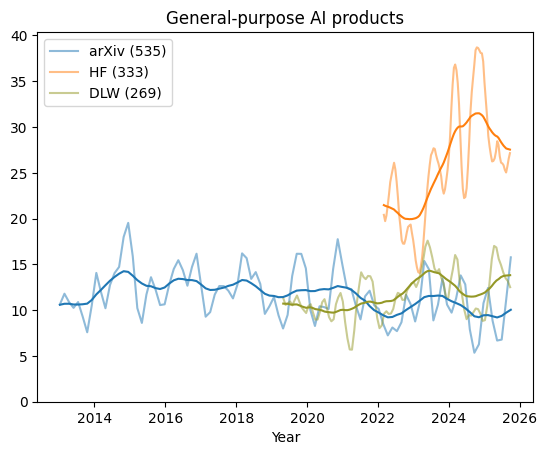

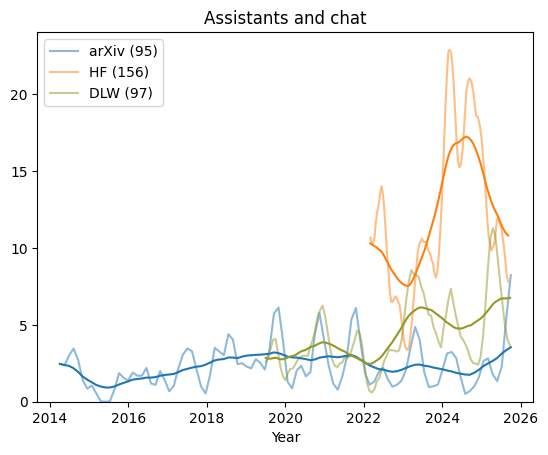

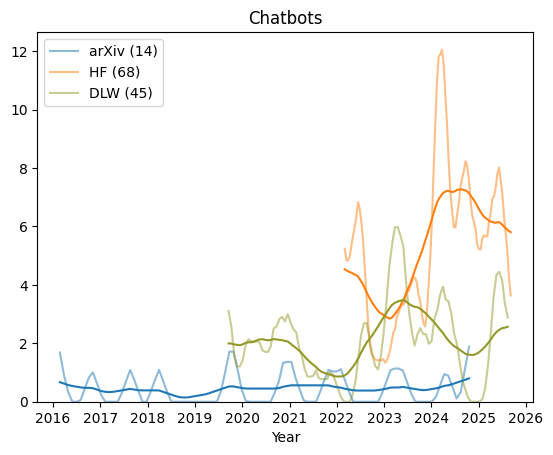

...

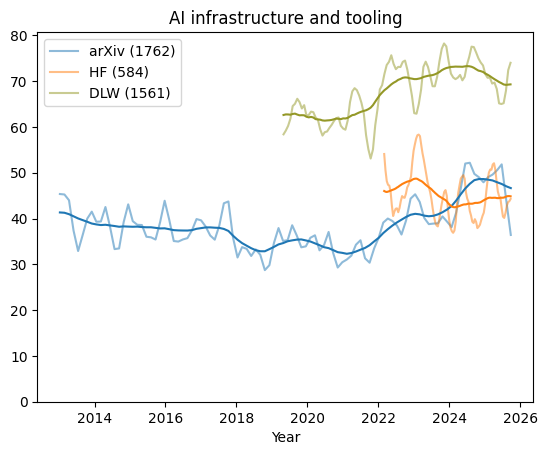

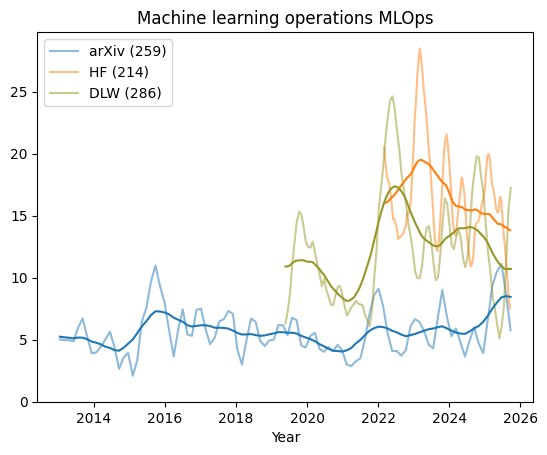

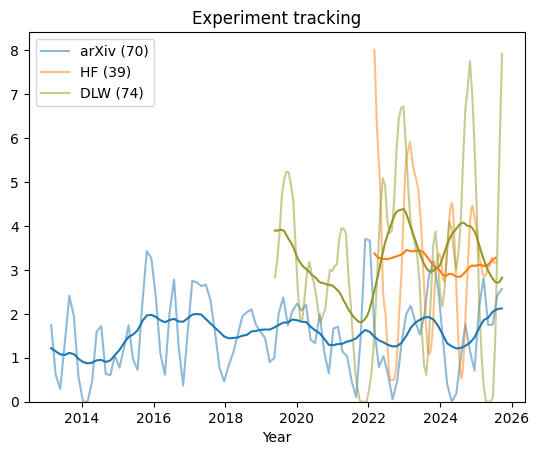

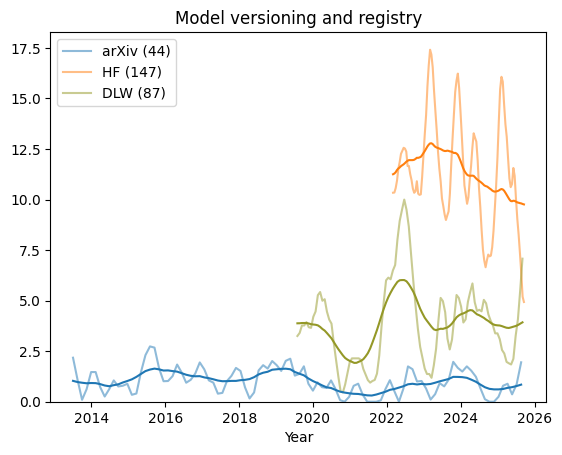

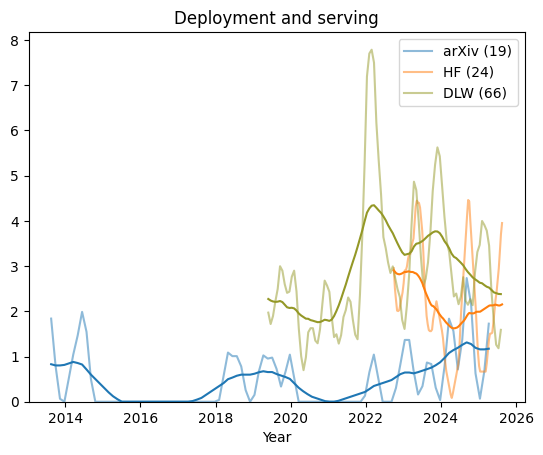

/var/folders/kc/4fy77x1j1dz0t15g8zhlqmkc0000gn/T/ipykernel_86165/914863173.py:130: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  all_dates = arx_long[arx_long["predicted_tag"].str.contains("'"+term+"'")]["date"]


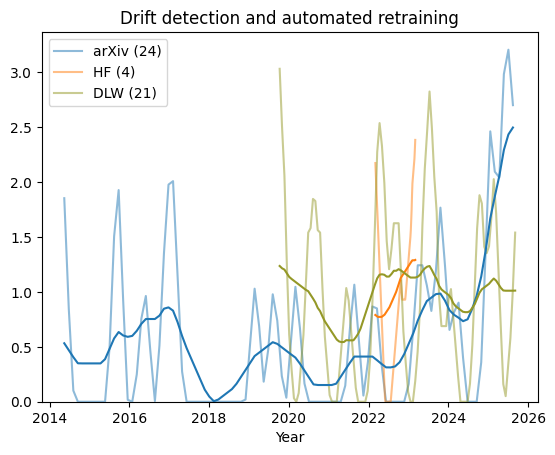

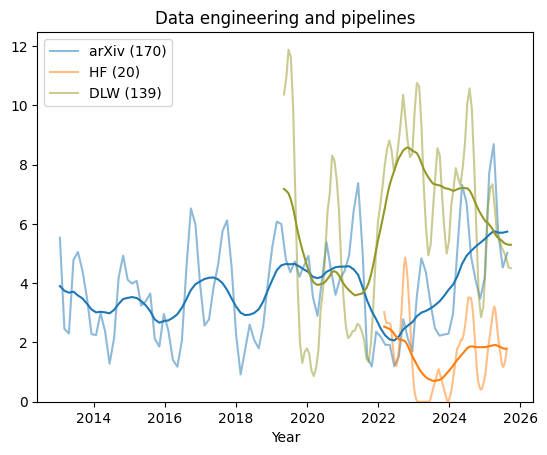

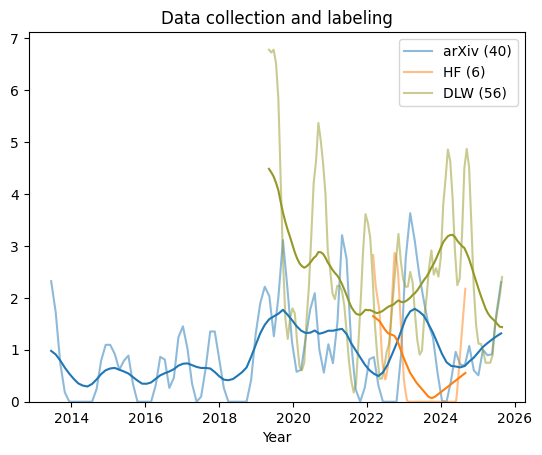

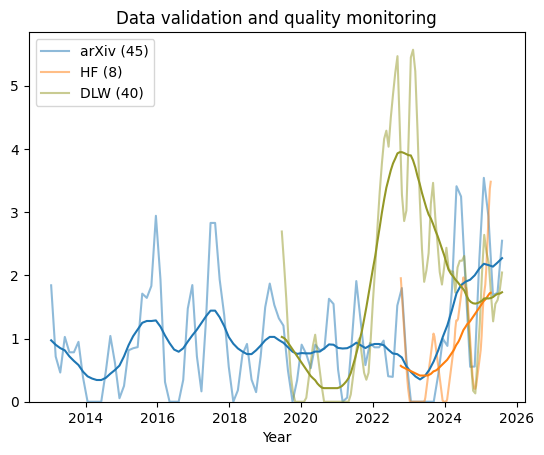

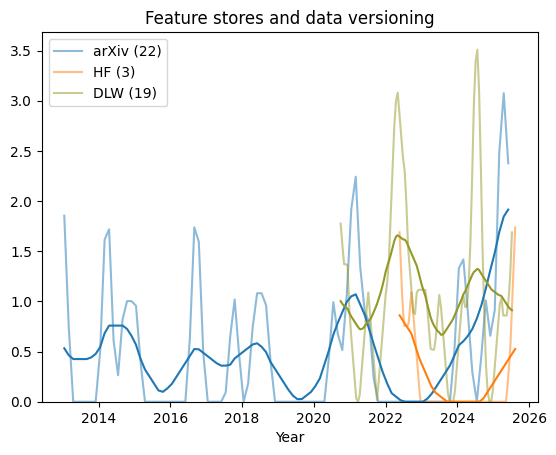

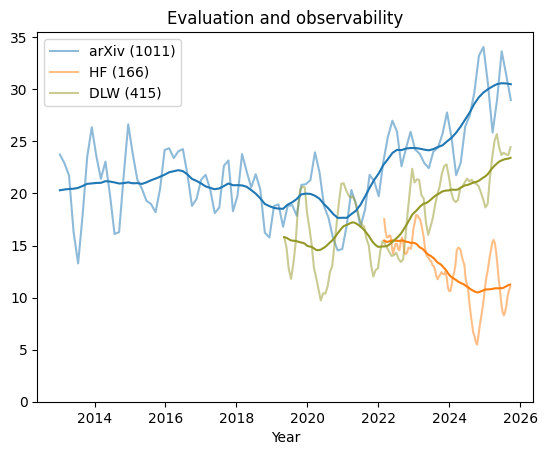

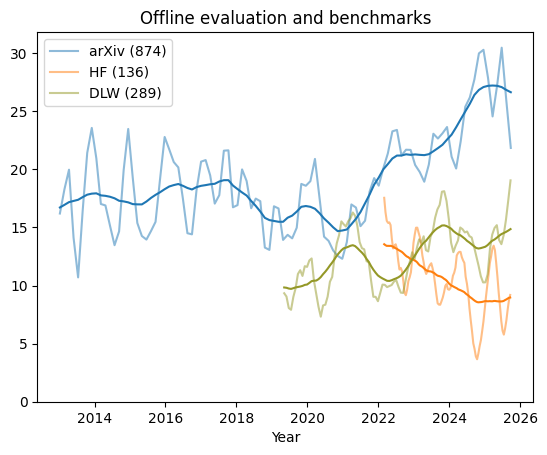

/var/folders/kc/4fy77x1j1dz0t15g8zhlqmkc0000gn/T/ipykernel_86165/914863173.py:130: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  all_dates = arx_long[arx_long["predicted_tag"].str.contains("'"+term+"'")]["date"]


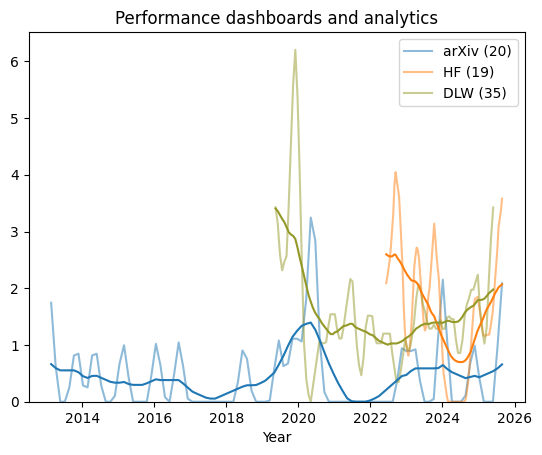

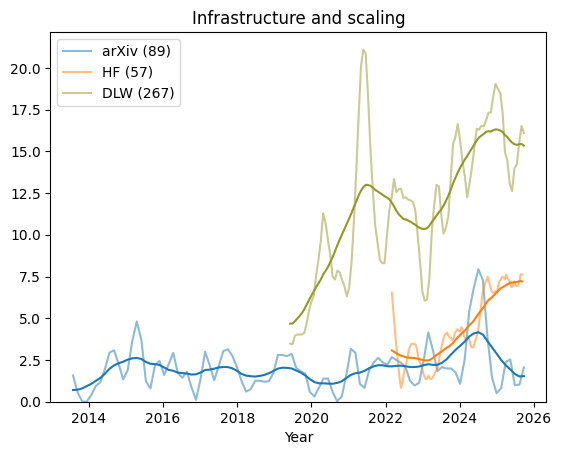

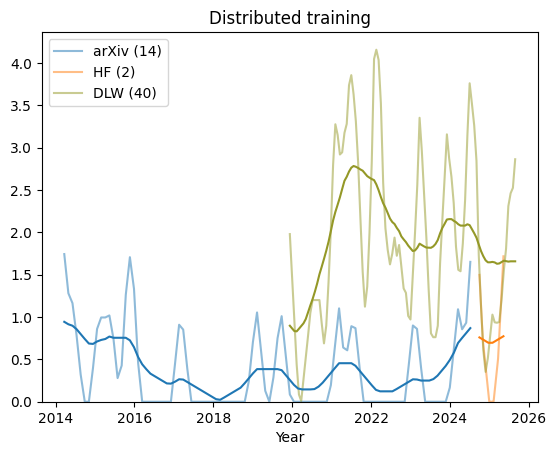

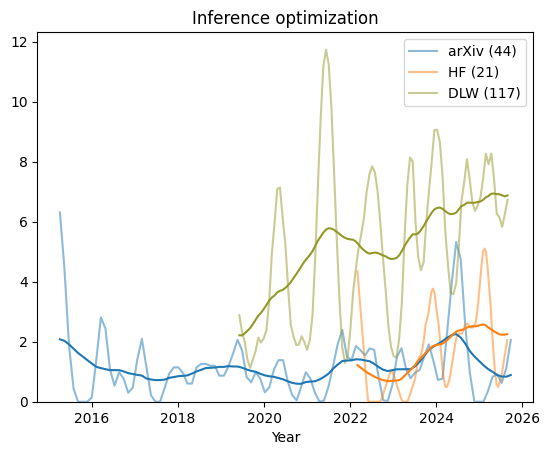

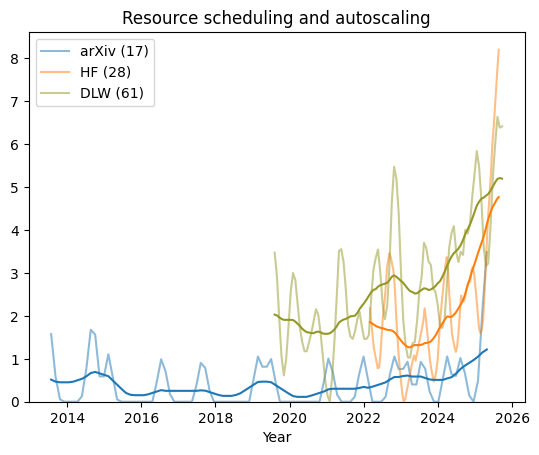

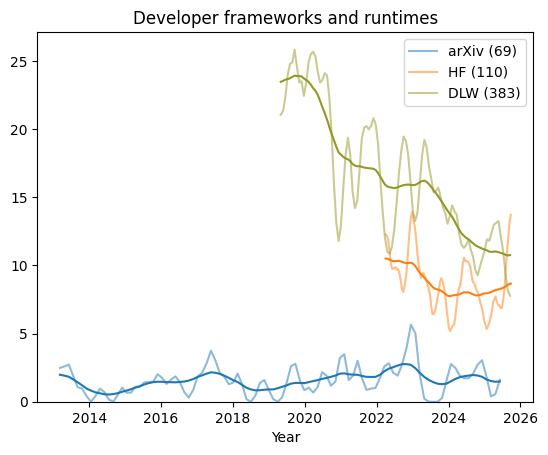

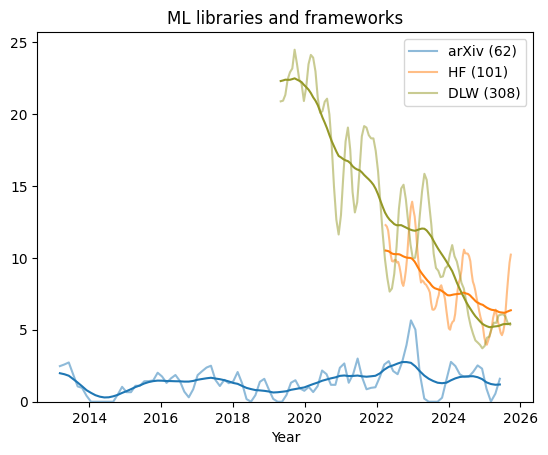

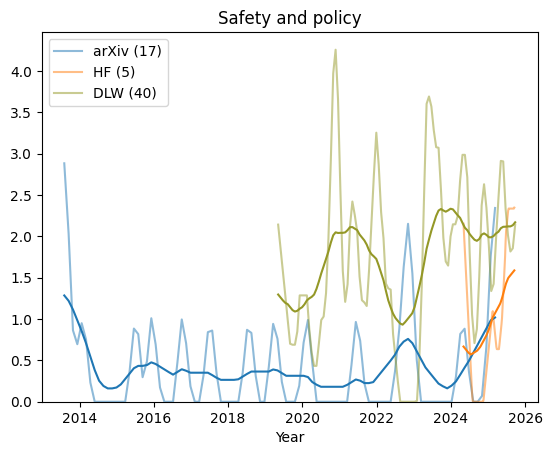

/var/folders/kc/4fy77x1j1dz0t15g8zhlqmkc0000gn/T/ipykernel_86165/914863173.py:130: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  all_dates = arx_long[arx_long["predicted_tag"].str.contains("'"+term+"'")]["date"]


In [6]:
for term in ccs_strings:
    #plot_term_long_arx(term, 10, 30)
    plot_term_continuous_long(term, 10, (52.17/4, "W"))


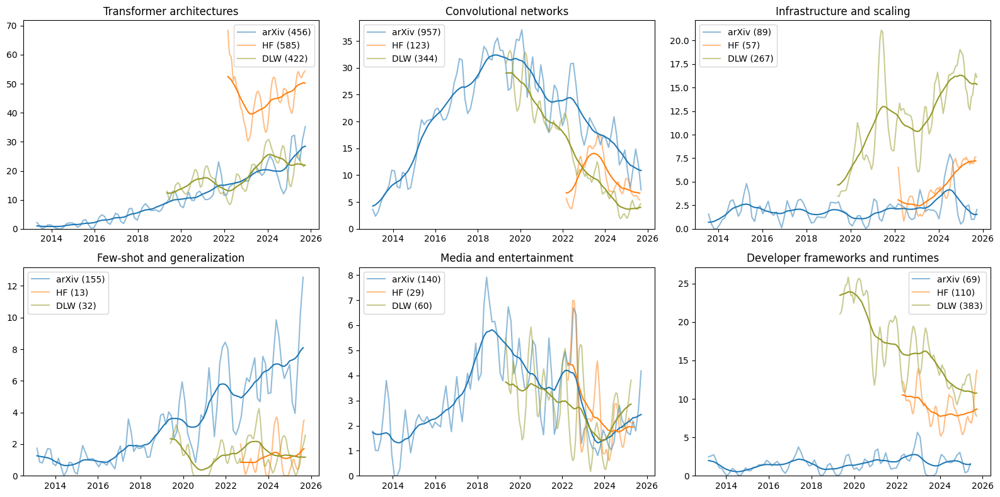

In [4]:
example_terms = ["Transformer architectures", "Convolutional networks", "Infrastructure and scaling", 
                 "Few-shot and generalization", 
                 #"Media, education and culture", 
                 "Media and entertainment", 
                 "Developer frameworks and runtimes"]

Fig, axs = plt.subplots(2,3, 
                        sharex=False, 
                        sharey=False, 
                        figsize=(16,8))
for i in range(len(example_terms)):
    
    #plot_term_long_arx(term, 10, 30)
    term = example_terms[i]
    ax = axs[i//3, i%3]
    plot_term_continuous_long(term, 10, (52.17/4, "W"), ax=ax) # 52.17 weeks per year avg
plt.tight_layout()
#plt.savefig("../../../figs/example_plots.pdf")
plt.show()

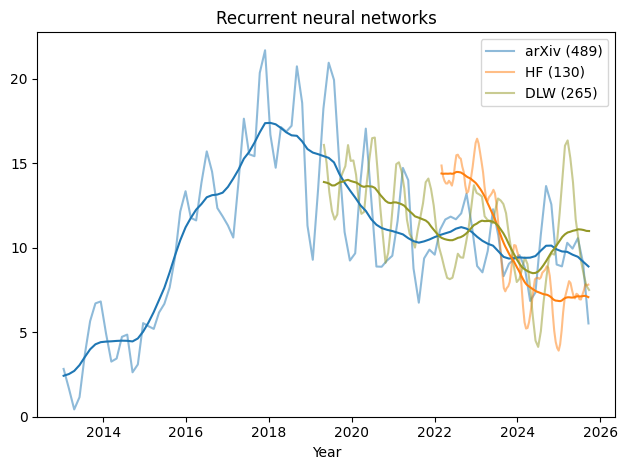

In [ ]:
fig, ax = plt.subplots(1, 1)#, figsize=(6, 4))

    
plot_term_continuous_long("Recurrent neural networks", 10, (52.17/4, "W"), ax=ax) # 52.17 weeks per year avg
plt.xlabel("Year")

plt.tight_layout()
#plt.savefig("../../../figs/Recurrent_neural_networks.pdf")
plt.show()